# RECOMMENDATION SYSTEM

COMPUTATIONAL TOOLS FOR DATA SCIENCE 02807

Arthors:     
    Yuxuan Zhang - s212626         
    Ke Yang - s212495    
    Karthikraja Karunakaran - s220062  
    Xindi Wu - s225521

## Please Change the file path to your own path first and run all.

## **Install the required libraries**

In [169]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


## **LOAD & CHECK DATA**

In [170]:
# import necessarry modules

import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
import requests
import random
from nltk.corpus import stopwords
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import RegexpTokenizer
import re
import string
from io import BytesIO
import matplotlib.pyplot as plt
import textblob
%matplotlib inline

In [171]:
# Change the path to your own path
# If you can not read 'books.csv', please change the format of the file to 'utf8'
df_BookTags=pd.read_csv('book_tags.csv')
df_Books=pd.read_csv('books.csv')
df_ExampleUser=pd.read_csv('personalLibrary.csv')
df_User2Book_Rating=pd.read_csv('ratings_new.csv')
df_Tags=pd.read_csv('tags.csv')
df_User2Book=pd.read_csv('to_read.csv')

In [172]:
# import datasets and inspect respectively
# Change the path to your own path
books = pd.read_csv("books.csv")
books.head(3)

,book_id,goodreads_book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,...,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
2,3,41865,41865,3212258,226,316015849,9.780316e+12,Stephenie Meyer,2005.0,Twilight,...,3866839,3916824,95009,456191,436802,793319,875073,1355439,https://images.gr-assets.com/books/1361039443m...,https://images.gr-assets.com/books/1361039443s...


#### content for each feature

book_id: A unique identity for each book  
goodreads_book_id: A unique identity for each book at goodreads.com  
best_book_id: A unique identity for each book at best_book.net  
isbn,isbn13:International Standard Book Number  
authors: Author of the books  
original_publication_year:Year in which the book was first published  
original_title:Title of book first published  
title:Current title of the book  
language_code:The language of books  
average_rating:Average rating of books  
ratings_count:Number of people who rated this book  

In [173]:
# print out descriptive facts

print("there are", len(books["authors"].unique()),"different authors for",len(books["book_id"].unique()),"books")
print("there are", len(books["language_code"].unique()),"different languages codes")
print("a book has at least got",books.ratings_count.min(),"past ratings")
print("the average rating ranges between",books.average_rating.min(),"and",books.average_rating.max())

there are 4664 different authors for 10000 books
there are 26 different languages codes
a book has at least got 2716 past ratings
the average rating ranges between 2.47 and 4.82


In [174]:
# Change the path to your own path
ratings=pd.read_csv("ratings_new.csv")
ratings.head(3)

,Unnamed: 0,user_id,book_id,rating
0,0,1,258,5
1,1,2,4081,4
2,2,2,260,5


In [175]:
print("there are",len(ratings.user_id.unique()), "users who have rated at least one book")
print(len(ratings.book_id.unique()), "unique books have been rated")
print("average number of ratings for each user:",round(ratings.shape[0]/len(ratings.user_id.unique())))
print("total number of particular user_book rating pairs:",ratings.shape[0])

there are 999 users who have rated at least one book
8173 unique books have been rated
average number of ratings for each user: 114
total number of particular user_book rating pairs: 113411


In [176]:
# inspect null values for crucial features

print("Any null values in Books:\n" ,books.isnull().sum())
print("Any null values in Ratings:\n ",ratings.isnull().sum())

print("Any missing book titles?", books.title.isna().any())

Any null values in Books:
 book_id                         0
goodreads_book_id               0
best_book_id                    0
work_id                         0
books_count                     0
isbn                          700
isbn13                        585
authors                         0
original_publication_year      21
original_title                585
title                           0
language_code                1084
average_rating                  0
ratings_count                   0
work_ratings_count              0
work_text_reviews_count         0
ratings_1                       0
ratings_2                       0
ratings_3                       0
ratings_4                       0
ratings_5                       0
image_url                       0
small_image_url                 0
dtype: int64
Any null values in Ratings:
  Unnamed: 0    0
user_id       0
book_id       0
rating        0
dtype: int64
Any missing book titles? False


## **PREPROCESSING**

In [177]:
# merge book's metadata and its book_user rating pairs to get a complete df,
# and delete unnecesssary features to save memory
# in our case, we consider the rating data in books df as the total rating data, 
# and ratings in rating df as the recent data 

books_data=books.merge(ratings,on="book_id") 
books_data.drop(columns=["goodreads_book_id","best_book_id","work_text_reviews_count", "work_id","books_count","isbn13","isbn","original_publication_year","original_title","work_ratings_count","image_url"],inplace=True)
books_data.head()

,book_id,authors,title,language_code,average_rating,ratings_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,small_image_url,Unnamed: 0,user_id,rating
0,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603s...,300556,695,5
1,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603s...,339979,975,5
2,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603s...,344359,208,5
3,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603s...,363989,677,5
4,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603s...,385279,292,5


# Main thoughts
Our system can be splited to two main parts: 'for new users' and 'for old users'.  And the 'for old users' part includes some different methods.

------------------------------------------------------------------------------

# FOR NEW USERS

## **POPULARITY BASED RECOMMENDATION SYSTEM - GENERAL RECOMMENDATION**

In [178]:
# calculate a score of popularity based on high rating scores and most recently rated(both from data stored in ratings df)

def popular_books(df,n=10):
    '''
    A function to retreive popular books by weighting score and number of recent ratings.
    '''
    
    rating_count=df.groupby("book_id")["rating"].count().reset_index() # count total number of recent ratings for each book
    rating_count.rename(columns={"rating":"NumberOfVotes"},inplace=True) 
    
    rating_average=df.groupby("book_id")["rating"].mean().reset_index() # calculate the mean of recent ratings
    rating_average.rename(columns={"rating":"AverageRatings"},inplace=True)
    
    popularBooks=rating_count.merge(rating_average,on="book_id") 
    
    C=popularBooks["AverageRatings"].mean() 
    m=popularBooks["NumberOfVotes"].quantile(0.90)
    
    def weighted_rate(x): # define the formula of weighted rate for rating scores and numbers to gain robustness
        v=x["NumberOfVotes"]
        R=x["AverageRatings"]
        
        return ((v*R) + (m*C)) / (v+m)
    
    popularBooks=popularBooks[popularBooks["NumberOfVotes"] >= popularBooks["NumberOfVotes"].quantile(0.10)] 
    # filter out recently less rated books
    popularBooks["Popularity"]=popularBooks.apply(weighted_rate,axis=1)
    # calculate popularity score for each book according to the defined formula
    popularBooks=popularBooks.sort_values(by="Popularity",ascending=False)
    # show the books from the highest popularity score to the lowest
    popularBooks=popularBooks.merge(books[["book_id","title","authors"]], how="left", on="book_id")
    # merge metadata to have a complete overview of the results
    
    return popularBooks[["book_id","title","authors","NumberOfVotes","AverageRatings","Popularity"]].reset_index(drop=True).head(n)

In [179]:
# example output dataframe of popular_books

popular_books(books_data)

,book_id,title,authors,NumberOfVotes,AverageRatings,Popularity
0,25,Harry Potter and the Deathly Hallows (Harry Po...,"J.K. Rowling, Mary GrandPré",327,4.486239,4.418856
1,102,Where the Wild Things Are,Maurice Sendak,139,4.474820,4.335003
2,50,Where the Sidewalk Ends,Shel Silverstein,201,4.402985,4.310132
3,4,To Kill a Mockingbird,Harper Lee,402,4.333333,4.288569
4,490,Maus I: A Survivor's Tale: My Father Bleeds Hi...,Art Spiegelman,57,4.543860,4.249438
5,161,"The Return of the King (The Lord of the Rings,...",J.R.R. Tolkien,123,4.357724,4.226952
6,143,All the Light We Cannot See,Anthony Doerr,134,4.328358,4.211821
7,126,Dune (Dune Chronicles #1),Frank Herbert,101,4.366337,4.211746
8,983,Between the World and Me,Ta-Nehisi Coates,61,4.459016,4.205984
9,27,Harry Potter and the Half-Blood Prince (Harry ...,"J.K. Rowling, Mary GrandPré",307,4.254072,4.203996


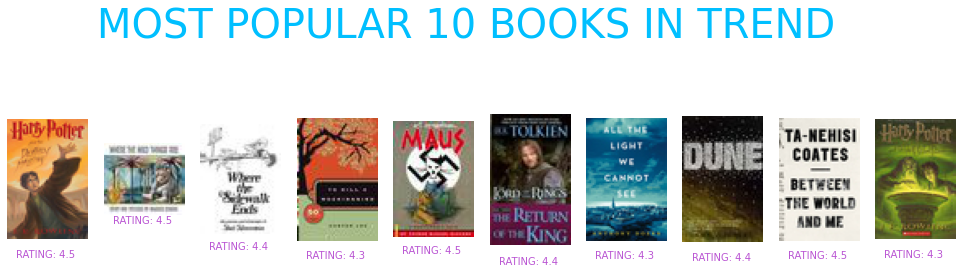

In [180]:
# conduct the 10 most pupolar book search, and show the pitcure of results in graphs

n=10
top_ten=pd.DataFrame(popular_books(books_data,n))
fig,ax=plt.subplots(1,10,figsize=(17,5))
fig.suptitle("MOST POPULAR 10 BOOKS IN TREND",fontsize=40,color="deepskyblue")
for i in range(len(top_ten["book_id"].tolist())):
    url=books_data.loc[books_data["book_id"]==top_ten["book_id"].tolist()[i],"small_image_url"][:1].values[0]
    img=Image.open(requests.get(url,stream=True).raw)
    ax[i].imshow(img)
    ax[i].axis("off")
    ax[i].set_title("RATING: {} ".format(round(books_data[books_data["book_id"]==top_ten["book_id"].tolist()[i]]["rating"].mean(),1)),y=-0.20,color="mediumorchid",fontsize=10)
    fig.show()

In [181]:
# this is the metadata of the top 10 popular books

top_ten

,book_id,title,authors,NumberOfVotes,AverageRatings,Popularity
0,25,Harry Potter and the Deathly Hallows (Harry Po...,"J.K. Rowling, Mary GrandPré",327,4.486239,4.418856
1,102,Where the Wild Things Are,Maurice Sendak,139,4.474820,4.335003
2,50,Where the Sidewalk Ends,Shel Silverstein,201,4.402985,4.310132
3,4,To Kill a Mockingbird,Harper Lee,402,4.333333,4.288569
4,490,Maus I: A Survivor's Tale: My Father Bleeds Hi...,Art Spiegelman,57,4.543860,4.249438
5,161,"The Return of the King (The Lord of the Rings,...",J.R.R. Tolkien,123,4.357724,4.226952
6,143,All the Light We Cannot See,Anthony Doerr,134,4.328358,4.211821
7,126,Dune (Dune Chronicles #1),Frank Herbert,101,4.366337,4.211746
8,983,Between the World and Me,Ta-Nehisi Coates,61,4.459016,4.205984
9,27,Harry Potter and the Half-Blood Prince (Harry ...,"J.K. Rowling, Mary GrandPré",307,4.254072,4.203996


# FOR OLD USERS

## **ITEM-BASED COLLABORATIVE FILTERING**

In [182]:
# build the pivot table of book_user rating pairs

ratings_pivot = books_data[['user_id', 'rating', 'book_id']].pivot_table(index=["user_id"],columns=["book_id"],values="rating")
ratings_pivot.head() # nan values mean the book has not been rated by a user

book_id,1,2,3,4,5,6,7,8,9,10,...,9985,9988,9990,9991,9993,9995,9997,9998,9999,10000
user_id,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,5.0,NaN,NaN,5.0,NaN,NaN,4.0,NaN,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,5.0,NaN,4.0,4.0,NaN,4.0,4.0,NaN,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [183]:
def item_based(book_id, df):
    '''
    A function to retireve item_based recommendations for a particular book. The logic is to find other books both with high 
    positive pair-wise correlation of rates and high score of rates.
    '''

    if book_id not in df["book_id"].values:
        print("❌ BOOK NOT FOUND ❌") # raise error if the book id is not found 
    else:
        book = ratings_pivot[book_id] # input a particular book
        recommendation_df = pd.DataFrame(ratings_pivot.corrwith(book).sort_values(ascending=False))[:20].reset_index(drop=False).drop([0],axis=0)
        # calculate the pairwise correlations with this book and show the results in descending order
        recommendation_df = recommendation_df.rename(columns={0:"correlation"})
        recommendation_df = recommendation_df.merge(books[["book_id", "title", "small_image_url","average_rating"]], how="left", on="book_id")
        # add metadata to the recommendation dataframe
        recommendation_df = recommendation_df[recommendation_df["average_rating"] > 3][:5]
        # filter out books without high rates and only keep the top 5
    
        # show the pitcure of results in graphs
        fig, ax = plt.subplots(1,5,figsize=(17,5))
        fig.suptitle("WOULD YOU LIKE TO TRY THESE BOOKS?", fontsize=40, color="deepskyblue")
        for i in range(recommendation_df.shape[0]):
            url=recommendation_df.loc[i,"small_image_url"]
            img=Image.open(requests.get(url,stream=True).raw)
            ax[i].imshow(img)
            ax[i].axis("off")
            ax[i].set_title("RATING: {} ".format(round(recommendation_df.loc[i,"average_rating"],2),y=0-.2,color="mediumorchid",fontsize=22))
            fig.show()
    
    return recommendation_df

,book_id,correlation,title,small_image_url,average_rating
0,2658,1.0,"Moving Pictures (Discworld, #10; Industrial Re...",https://images.gr-assets.com/books/1320456553s...,3.91
1,5128,1.0,Lunar Park,https://s.gr-assets.com/assets/nophoto/book/50...,3.60
2,355,1.0,"Graceling (Graceling Realm, #1)",https://images.gr-assets.com/books/1331548394s...,4.10
3,6611,1.0,"Preacher, Volume 4: Ancient History",https://images.gr-assets.com/books/1309916054s...,4.25
4,9173,1.0,"The Twentieth Wife (Taj Mahal Trilogy, #1)",https://s.gr-assets.com/assets/nophoto/book/50...,4.03


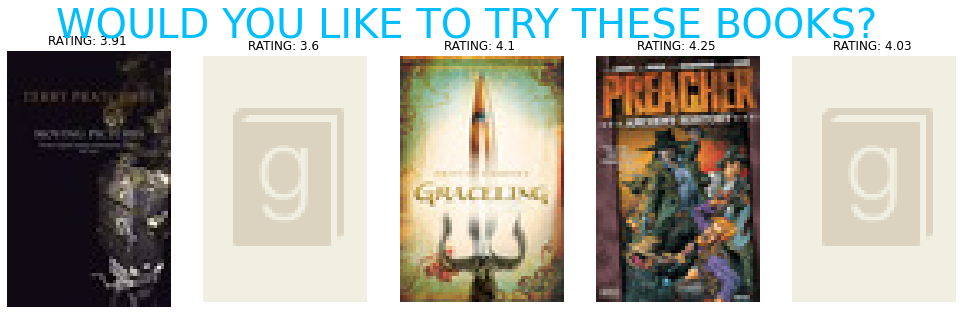

In [184]:
# what will be the recommended books for book 10?

item_based(10, books_data)

## **USER-BASED COLLABORATIVE FILTERING**

In [185]:
# because we will later use the cosine similarity function, na values need to be filled with 0

ratings_pivot.fillna(0,inplace=True)

In [186]:
def users_choice(user_id):
    '''A function to retrieve 5 books a user has rated of highest rating score'''
    users_fav=books_data[books_data["user_id"]==user_id].sort_values(["average_rating"],ascending=False)[0:5]
    return users_fav

In [187]:
def user_based(df,user_id):
    '''
    A function to find similar users by implementing cosine similarity.
    '''
        
    if user_id not in df["user_id"].values:
        print("❌ USER NOT FOUND ❌") # raise error if the user id is not found 
                
    else:
        index = np.where(ratings_pivot.index==user_id)[0][0] # calculate index in ratings_pivot df given user id
        similarity = cosine_similarity(ratings_pivot) # conduct cosine similarity measurement for all user pairs
        similar_users = list(enumerate(similarity[index])) # get all cosine similarity score related to a paritular user 
        similar_users = sorted(similar_users,key = lambda x:x[1],reverse=True)[0:5] # get the top 5 similar users
    
        user_rec = []
    
        for i in similar_users: # collect ids of the most similar users into a list 
                data=df[df["user_id"]==ratings_pivot.index[i[0]]]
                user_rec.extend(list(data.drop_duplicates("user_id")["user_id"].values))
        
    return user_rec

In [188]:
def common(df,user,user_id):
    '''
    A function to find high-rating books that similar users have read other than what have already been read from the user.
    '''
    x=df[df["user_id"]==user_id]
    recommend_books=[]
    user=list(user)
    for i in user:
        y=df[(df["user_id"]==i)]
        books=y.loc[~y["book_id"].isin(x["book_id"]),:]
        books=books.sort_values(["average_rating"],ascending=False)[0:1] # get his best rated book 
        recommend_books.append(books["book_id"].values)
    
    return recommend_books[1:5]

🟦 USER: 856 


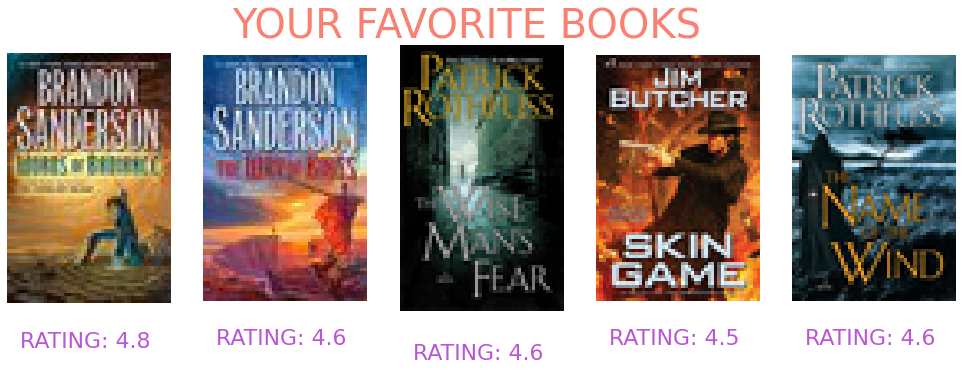

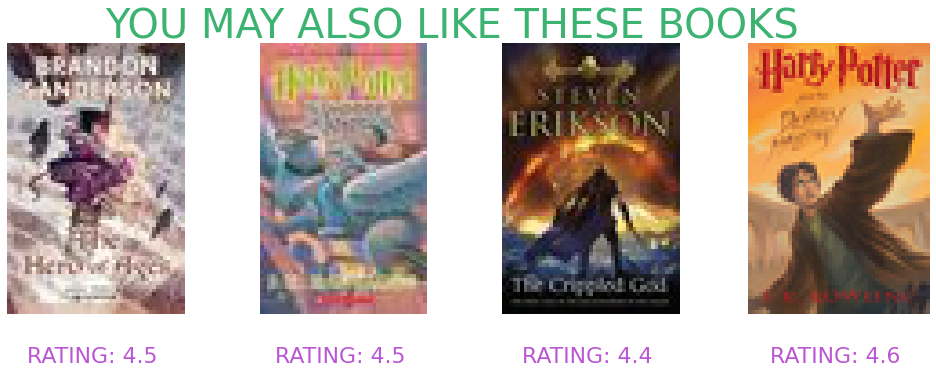

In [189]:
# get user_id and plot his favorite books

user_id=random.choice(books_data["user_id"].values)
user_choice_df=pd.DataFrame(users_choice(user_id))
user_favorite=users_choice(user_id)
n=len(user_choice_df["book_id"].values)

print("🟦 USER: {} ".format(user_id))
fig,ax=plt.subplots(1,n,figsize=(17,5))
fig.suptitle("YOUR FAVORITE BOOKS",fontsize=40,color="salmon")
for i in range(n):
    url=books_data.loc[books_data["book_id"]==user_choice_df["book_id"].tolist()[i],"small_image_url"][:1].values[0]
    img=Image.open(requests.get(url,stream=True).raw)
    ax[i].imshow(img)
    ax[i].axis("off")
    ax[i].set_title("RATING: {} ".format(round(books_data[books_data["book_id"]==user_choice_df["book_id"].tolist()[i]]["average_rating"].mean(),1)),y=-0.20,color="mediumorchid",fontsize=22)
    fig.show()
    
# get similar users' list and plot their favorite books

user_based_rec=user_based(books_data,user_id)
books_for_user=common(books_data,user_based_rec,user_id)
books_for_userDF=pd.DataFrame(books_for_user,columns=["book_id"])

fig,ax=plt.subplots(1,4,figsize=(17,5))
fig.suptitle("YOU MAY ALSO LIKE THESE BOOKS",fontsize=40,color="mediumseagreen")
for i in range(4):
    url=books_data.loc[books_data["book_id"]==books_for_userDF["book_id"].tolist()[i],"small_image_url"][:1].values[0]
    img=Image.open(requests.get(url,stream=True).raw)
    ax[i].imshow(img)
    ax[i].axis("off")
    ax[i].set_title("RATING: {} ".format(round(books_data[books_data["book_id"]==books_for_userDF["book_id"].tolist()[i]]["average_rating"].mean(),1)),y=-0.20,color="mediumorchid",fontsize=22)
    fig.show()

## **CONTENT-BASED COLLABORATIVE FILTERING** 

### Exploratory Data Analysis
 

#### language_code distribution

<AxesSubplot:>

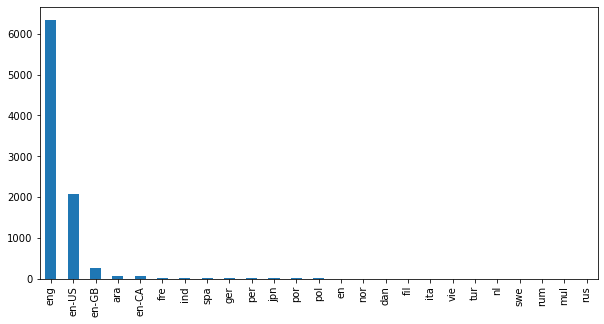

In [190]:
books['language_code'].value_counts().plot(x = 'language_code', y ='count', kind = 'bar', figsize = (10,5)  )

In [191]:
# Printing the book title and language_code randomly
books['title'] [4]
books['language_code'][4]

'eng'

In [192]:
# Printing the book title and language_code randomly
books['title'] [6]
books['language_code'][6]

'en-US'

<AxesSubplot:title={'center':'Word Count Distribution for book descriptions'}, ylabel='Frequency'>

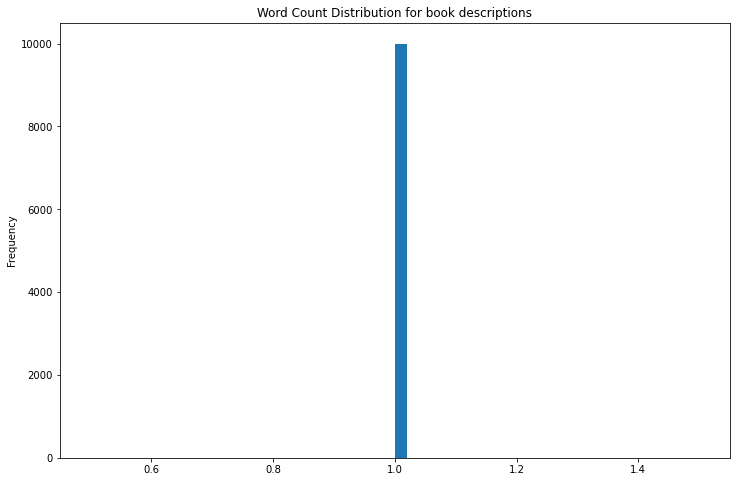

In [193]:
# Calculating the word count for book description
books['word_count'] = books['language_code'].apply(lambda x: len(str(x).split()))# Plotting the word count
books['word_count'].plot(
    kind='hist',
    bins = 50,
    figsize = (12,8),title='Word Count Distribution for book descriptions')

<AxesSubplot:title={'center':'Bigram disribution for the book language'}, xlabel='bigram'>

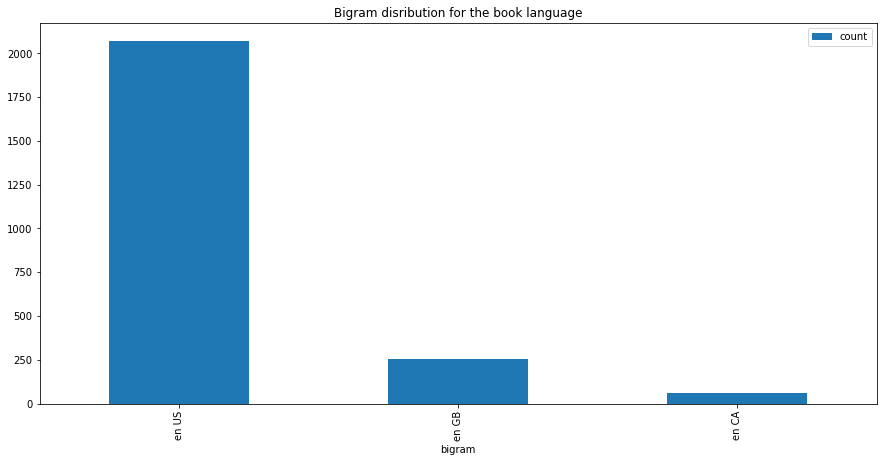

In [194]:
#Converting text descriptions into vectors using TF-IDF using Bigram
tf = TfidfVectorizer(ngram_range=(2, 2), stop_words='english', lowercase = False)
tfidf_matrix = tf.fit_transform(books['language_code'].apply(lambda x: np.str_(x)))
total_words = tfidf_matrix.sum(axis=0) 
#Finding the word frequency
freq = [(word, total_words[0, idx]) for word, idx in tf.vocabulary_.items()]
freq =sorted(freq, key = lambda x: x[1], reverse=True)
#converting into dataframe 
bigram = pd.DataFrame(freq)
bigram.rename(columns = {0:'bigram', 1: 'count'}, inplace = True) 
#Taking first 20 records
bigram = bigram.head(20)

#Plotting the bigram distribution
bigram.plot(x ='bigram', y='count', kind = 'bar', title = "Bigram disribution for the book language", figsize = (15,7), )

## Recommendation based on book title

In [195]:
# Function for recommending books based on Book title. It takes book title and language_code as an input.
def recommend(title, language_code):
    
    # Matching the language_code with the dataset and reset the index
    data = books.loc[books['language_code'] == language_code]  
    data.reset_index(level = 0, inplace = True) 
  
    # Convert the index into series
    indices = pd.Series(data.index, index = data['title'])
    
    #Converting the book title into vectors and used bigram
    tf = TfidfVectorizer(analyzer='word', ngram_range=(2, 2), min_df = 1, stop_words='english')
    tfidf_matrix = tf.fit_transform(data['title'])
    
    # Calculating the similarity measures based on Cosine Similarity
    sg = cosine_similarity(tfidf_matrix, tfidf_matrix)
    
    # Get the index corresponding to original_title
       
    idx = indices[13]# Get the pairwsie similarity scores 
    sig = list(enumerate(sg[idx]))# Sort the books
    sig = sorted(sig, key=lambda x: x[1], reverse=True)# Scores of the 5 most similar books 
    sig = sig[1:6]# Book indicies
    movie_indices = [i[0] for i in sig]
   
    # Top 5 book recommendation
    rec = data[['title', 'image_url']].iloc[movie_indices]
       
    # It reads the top 5 recommended book urls and print the images
    
    for i in rec['image_url']:
        response = requests.get(i)
        img = Image.open(BytesIO(response.content))
        plt.figure()
        plt.imshow(img)
    return data['book_id'].iloc[movie_indices]

0        1
377    507
16      20
1        2
2        4
Name: book_id, dtype: int64

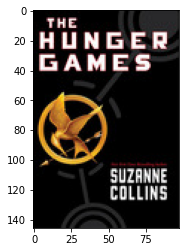

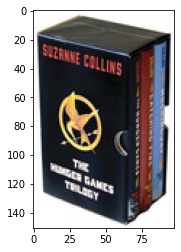

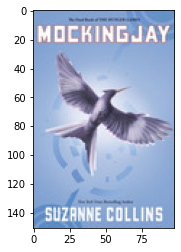

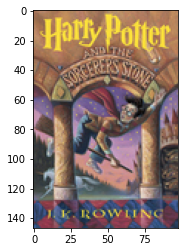

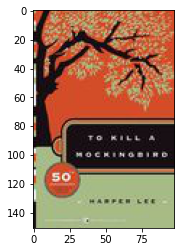

In [196]:
recommend("games","eng")

## Market basket analysis

In market basket analysis, multiple 'baskets' are required, as well as multiple 'items' in the 'basket'. That is, a multiple-to-multiple relationship. In the ratings file, there are user ratings of books, a multiple-to-multiple relationship between users and books. Also, based on the ratings, it is possible to filter out whether a user likes or dislikes a book. Here, we have chosen a relationship with a rating of 5 as the threshold for a user liking the book.

In [197]:
df_User2Book_Rating

,Unnamed: 0,user_id,book_id,rating
0,0,1,258,5
1,1,2,4081,4
2,2,2,260,5
3,3,2,9296,5
4,4,2,2318,3
...,...,...,...,...
113406,5975082,198,5422,4
113407,5975250,678,6327,4
113408,5975843,198,3683,4
113409,5975862,565,260,4


In [198]:
data_bi=df_User2Book_Rating[df_User2Book_Rating['rating']==5][['book_id']]

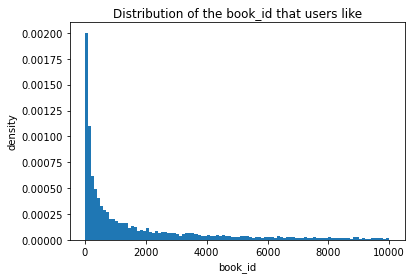

In [199]:
import matplotlib.pyplot as plt
plt.hist(data_bi,bins=100,density=True)
plt.title('Distribution of the book_id that users like')
plt.xlabel('book_id')
plt.ylabel('density')
plt.show()

Above are probability density images for books rated 5. As you can see, the books with smaller ids are more popular, with far more people rating them than the books that follow. This also causes the data to be so biased that it affects the effectiveness of the subsequent Apriori algorithm. But this is in line with the real world situation.

## Apriori

This function is used to calculate the support of the items in each candidate set By counting the number of times it appears in the original data (the relationship with a rating of 5) and then dividing by the number of users. Filter them using a pre-determined minimum support to obtain frequent itemsets of size 1.  
When this function was first executed, i.e. when filtering a frequent collection with only one item, many books with relatively large ids were pruned because the data was heavily skewed.Therefore they do not subsequently appear in any frequent item sets.

In [200]:
def CtoL_SupDic(DataSet, Ck_items, MinSupport):
    ValueDic = {}
    Lk_items = []
    SupDic = {}

    for datas in DataSet:
        datas_=set(datas)
        for itemSet in Ck_items:
            if itemSet.issubset(datas_):  
                if itemSet in ValueDic:
                    ValueDic[itemSet] += 1
                else:
                    ValueDic[itemSet] = 1

    for itemSet in ValueDic.keys():
        itemSupport=ValueDic[itemSet] / len(DataSet)
        if itemSupport >= MinSupport:
            Lk_items.append(itemSet)
            SupDic[itemSet] = itemSupport

    return Lk_items, SupDic

We then have a function LtoC that generates supersets of size k using frequent itemsets of size k-1. where the subsets of these supersets can only be sets belonging to frequent itemsets of size k-1.To achieve this, we iterated through all combinations of two and sorted them separately. If their first k-2 elements are the same, i.e. if their last elements are different, they are combined to generate a set of size k. By doing this, some sets of size k were obtained. But there is no guarantee that they are all frequent. So the frequent sets of size k are filtered by generating subsets of each set of size k and verifying that these subsets all belong to the frequent sets of items of size k - 1.

In [201]:
def Subsets(sets,n):
    import itertools
    subsets = []
    subsets_n=[]
    
    for i in range(len(sets) + 1):
        defined_len_set = list(itertools.combinations(sets, i))
        for i in defined_len_set:
            if i != ():
                subsets.append(i)
                
    for i in subsets:
        if len(i)==n:
            i=set(i)
            subsets_n.append(i)
    return subsets_n

def LtoC(L_k, k):
    C_k = []  

    for i in range(len(L_k)):
        for j in range(i + 1, len(L_k)):
            L_k_1 = list(L_k[i])
            L_k_2 = list(L_k[j])
            L_k_1.sort()
            L_k_2.sort()

            if L_k_1[0:k-2] == L_k_2[0:k-2]:
                C_i = L_k[i] | L_k[j]
                C_subset=Subsets(C_i,k-1)
                temp_=1
                for m in C_subset:
                    if m not in L_k: 
                        temp_=0
                        
                if temp_==1:
                    C_k.append(C_i)

    return C_k

Then we have the main function Apriori, which uses the two functions mentioned above for looping. The first function generates frequent sets of size 1 (the first function), and then uses it to generate candidate sets of size 2 (the second function). The set of candidates of size 2 from the previous step is then used to generate the frequent set of size 2 (the first function). The cycle continues until the first function generates 0 frequent sets or the second function generates 0 candidate sets, thus obtaining the frequent sets of largest size. Then store the frequent sets of size from 1 to the maximum size into a list of sets.And their support.

In [202]:
def Apriori(DataSet, MinSupport):
    L_total = []
    SupDic_total = {}
    C1_items = []
    
    Set_ItemNum = 2

    for datas in DataSet:
        for data in datas:
            C1_items.append(frozenset([data]))
    C1_items_=set(C1_items)
    
    L1_items,SupDic1 = CtoL_SupDic(DataSet, C1_items_, MinSupport)

    L_total.append(L1_items)
    SupDic_total.update(SupDic1)

    while 1:
        C_k_items = LtoC(L_total[-1], Set_ItemNum)
        if C_k_items==[]:
            break
            
        L_k_items, SupDic_k = CtoL_SupDic(DataSet, C_k_items, MinSupport)
        
        if L_k_items==[]:
            break
            
        L_total.append(L_k_items)
        SupDic_total.update(SupDic_k)
        Set_ItemNum += 1
        
    return L_total, SupDic_total

Then by calculating the support of a frequent set of size k divided by the support of a frequent set of size k-1, to obtain the confidence that a set of size k - 1 infers another element of a set of size k.By comparing this with a predetermined minimum confidence level and doing this for every pair of (k,k-1) sets(Each pair differing in size by 1), the relations that are greater than the minimum confidence level can be filtered out.  
Then we get a lot of many-to-one relationships. Using the results above, it is possible to obtain many-to-many relations. But we do not think it is necessary. If a many-to-many relation is greater than the minimum confidence, then the multiple many-to-one relations split by it are all greater than the minimum confidence(due to the principle of joint probability).P(a,b|c,d,e)=P(a|c,d,e) * P(b|c,d,e). 

In [203]:
def Relations(L_total, SupDic_total, MinConf):
    relations = []
    
    for i in range(len(L_total) - 1):
        for L_low in L_total[i]:
            for L_high in L_total[i + 1]:
                if L_low.issubset(L_high):
                    confidence = SupDic_total[L_high] / SupDic_total[L_low]
                    I=L_low
                    J=L_high - L_low
                    relation = [I, J, confidence]
                    if confidence >= MinConf:
                        print(I,"-->",J,'confidence:',confidence)
                        relations.append(relation)
                        
    return relations

In [204]:
MinSupport=0.02
MinConf=0.9
    
data_set = []
    
data = df_User2Book_Rating[df_User2Book_Rating['rating']==5][['user_id','book_id']]

groups = data.groupby(by='user_id')
for group in groups:
    if len(group[1]) >= 2:
        data_set.append(group[1]['book_id'].tolist())

L, support_data = Apriori(data_set, MinSupport) 
realtion = Relations(L, support_data, MinConf)

frozenset({52}) --> frozenset({3}) confidence: 0.9130434782608695
frozenset({49}) --> frozenset({3}) confidence: 0.9130434782608695
frozenset({368}) --> frozenset({62}) confidence: 0.9310344827586207
frozenset({2, 27}) --> frozenset({18}) confidence: 0.9054054054054055
frozenset({27, 23}) --> frozenset({24}) confidence: 0.9016393442622951
frozenset({27, 23}) --> frozenset({18}) confidence: 0.9672131147540983
frozenset({27, 23}) --> frozenset({21}) confidence: 0.9508196721311475
frozenset({24, 27}) --> frozenset({21}) confidence: 0.9047619047619048
frozenset({2, 23}) --> frozenset({18}) confidence: 0.9206349206349206
frozenset({2, 23}) --> frozenset({21}) confidence: 0.9206349206349206
frozenset({2, 21}) --> frozenset({18}) confidence: 0.9178082191780822
frozenset({18, 23}) --> frozenset({21}) confidence: 0.9142857142857143
frozenset({21, 23}) --> frozenset({18}) confidence: 0.9696969696969697
frozenset({24, 23}) --> frozenset({27}) confidence: 0.9166666666666666
frozenset({24, 23}) -->

In [205]:
Rec_dic={}
front_list=[]
for i in range(len(realtion)):
    front=realtion[i][0]
    back=list(realtion[i][1])
    front_list.append(front)
    if front in Rec_dic:
        Rec_dic[front]+=back
    else:
        Rec_dic[front] = back

print(Rec_dic)

{frozenset({52}): [3], frozenset({49}): [3], frozenset({368}): [62], frozenset({2, 27}): [18], frozenset({27, 23}): [24, 18, 21], frozenset({24, 27}): [21], frozenset({2, 23}): [18, 21], frozenset({2, 21}): [18], frozenset({18, 23}): [21], frozenset({21, 23}): [18], frozenset({24, 23}): [27, 2, 18, 21], frozenset({10, 23}): [18], frozenset({25, 23}): [27, 18, 21], frozenset({24, 21}): [18], frozenset({10, 21}): [18], frozenset({161, 4}): [19], frozenset({161, 19}): [155], frozenset({19, 155}): [161], frozenset({17, 31}): [1], frozenset({161, 7}): [19], frozenset({480, 368}): [62], frozenset({25, 17}): [1], frozenset({155, 7}): [19], frozenset({2, 27, 23}): [24, 18, 21], frozenset({18, 2, 27}): [21, 24], frozenset({2, 27, 21}): [18, 24], frozenset({24, 2, 27}): [18, 21], frozenset({10, 2, 27}): [18], frozenset({24, 27, 23}): [2, 18, 21], frozenset({25, 27, 23}): [24, 18, 21], frozenset({18, 27, 23}): [24, 21], frozenset({24, 18, 27}): [21], frozenset({25, 18, 27}): [21], frozenset({27, 

In [206]:
print(front_list)

[frozenset({52}), frozenset({49}), frozenset({368}), frozenset({2, 27}), frozenset({27, 23}), frozenset({27, 23}), frozenset({27, 23}), frozenset({24, 27}), frozenset({2, 23}), frozenset({2, 23}), frozenset({2, 21}), frozenset({18, 23}), frozenset({21, 23}), frozenset({24, 23}), frozenset({24, 23}), frozenset({24, 23}), frozenset({24, 23}), frozenset({10, 23}), frozenset({25, 23}), frozenset({25, 23}), frozenset({25, 23}), frozenset({24, 21}), frozenset({10, 21}), frozenset({161, 4}), frozenset({161, 19}), frozenset({19, 155}), frozenset({17, 31}), frozenset({161, 7}), frozenset({480, 368}), frozenset({25, 17}), frozenset({155, 7}), frozenset({2, 27, 23}), frozenset({2, 27, 23}), frozenset({2, 27, 23}), frozenset({18, 2, 27}), frozenset({18, 2, 27}), frozenset({2, 27, 21}), frozenset({2, 27, 21}), frozenset({24, 2, 27}), frozenset({24, 2, 27}), frozenset({10, 2, 27}), frozenset({24, 27, 23}), frozenset({24, 27, 23}), frozenset({24, 27, 23}), frozenset({25, 27, 23}), frozenset({25, 27, 

In [207]:
def subsets(sets):
    import itertools
    subsets = []
    for i in range(len(sets) + 1):
        defined_len_set = list(itertools.combinations(sets, i))
        for i in defined_len_set:
            if i != ():
                subsets.append(frozenset(i))
    return subsets

def book_id2book_info(id):
    book_info=df_Books[df_Books['book_id']==id]
    return book_info

def Rec_old(books_list):
    rec_list=[]
    rec_books=[]
    rec_info=pd.DataFrame()
    rec_info_filter=pd.DataFrame()
    book_set=set(books_list)
#     book_subset=subsets(books_list)
#     print(book_subset)
#     for books in book_subset:
#         if books in front_list:
#             rec_list+=Rec_dic[books]

    for frontset in front_list:
        if frontset.issubset(book_set):
            rec_list+=(Rec_dic[frontset])
#     print(rec_list)
    if rec_list!=[]:
        rec_books=set(rec_list)
        rec_diff=list(set(rec_books).difference(set(books_list)))
        for i in range(len(rec_diff)):
            book_id=rec_diff[i]
            book_info=book_id2book_info(book_id)
            rec_info=pd.concat([rec_info,book_info])

    #     rec_info_filter=rec_info[['book_id','title','authors','language_code','average_rating','ratings_count']]
        rec_info_filter=rec_info[['title','authors','language_code','average_rating','ratings_count']]

        print('You may also like the following books:','\n')
        print(rec_info_filter)
        
        return rec_info
        
    else:
        recommandation_old_au_lan(books_list)
    

In [208]:
def recommandation_old_au_lan(book_input):
    df_au=pd.DataFrame()
    df_lan=pd.DataFrame()
    RecMix=pd.DataFrame()
    rec_info=pd.DataFrame()

    for i in range(len(book_input)):
        book_id=book_input[i]
        book_info=book_id2book_info(book_id)
        rec_info=pd.concat([rec_info,book_info])

    author_list=list(set(rec_info['authors']))
    language_list=list(set(rec_info['language_code']))
    # print(rec_info)

    for i in range(len(author_list)):
        author=author_list[i]
        df_=df_Books[df_Books['authors']==author]
        df_au=pd.concat([df_au,df_])

    for i in range(len(language_list)):
        language=language_list[i]
        df_2=df_Books[df_Books['language_code']==language]
        df_lan=pd.concat([df_lan,df_2])   

    RecByAuthor=df_au[['title','authors','language_code','average_rating','ratings_count']]
    RecByLanguage=df_lan[['title','authors','language_code','average_rating','ratings_count']]
    Book_history=rec_info[['title','authors','language_code','average_rating','ratings_count']]

    RecByAuthorNew=pd.concat([RecByAuthor,Book_history,Book_history]).drop_duplicates(keep=False)
    RecByLanguageNew=pd.concat([RecByLanguage,Book_history,Book_history]).drop_duplicates(keep=False)

    


    if len(RecByAuthorNew)==0 and len(RecByLanguageNew)==0:
        rating_medium=df_Books['ratings_count'].median()
        df_ratnum=df_Books[df_Books['ratings_count']>=rating_medium]
        df_ratnum=df_ratnum[~df_ratnum['book_id'].isin(book_input)]
        df_rating=df_ratnum.sort_values(by=['average_rating'],ascending=False).head(10)
        RecByAuthor=df_rating[['title','authors','language_code','average_rating','ratings_count']]

        print('These books may interest you:','\n')
        print(RecByAuthor)
        return

    if len(RecByAuthorNew)>0 and len(RecByLanguageNew)>0:
        RecMix=pd.merge(RecByAuthorNew,RecByLanguageNew)
        AuthorExMix=pd.concat([RecByAuthorNew,RecMix,RecMix]).drop_duplicates(keep=False)
        LanguageExMix=pd.concat([RecByLanguageNew,RecMix,RecMix]).drop_duplicates(keep=False)
        
        
    if len(RecMix)>0:
        print('* The book that Best fits your interested authors and languages:','\n')
        print(RecMix.sort_values(by=['average_rating'],ascending=False).head(10))
        print('\n')
        if len(AuthorExMix)>0:
            print('* Other recommendations for your interested Authors:','\n')
            print(AuthorExMix.sort_values(by=['average_rating'],ascending=False).head(10))
            print('\n')
        if len(LanguageExMix)>0:
            print('* Other recommendations for your interested Languages:','\n')
            print(LanguageExMix.sort_values(by=['average_rating'],ascending=False).head(10))
        return
    else:
        if len(RecByAuthorNew)>0:
            print('* Other recommendations for your interested Authors:','\n')
            print(RecByAuthorNew.sort_values(by=['average_rating'],ascending=False).head(10))
            print('\n')
        if len(RecByLanguageNew)>0:
            print('* Other recommendations for your interested Languages:','\n')
            print(RecByLanguageNew.sort_values(by=['average_rating'],ascending=False).head(10))
        return

## Test case for Apriori
Input: Assume the user's personal library is [23,24,27]. In other words, the user has read the book 23, book 24, book 27.  
output: Book recoomandation based on the [23,24,27].

The information about input book is as follows:  

In [209]:
book_input=[23,24,27]
rec_info=pd.DataFrame()
for i in range(len(book_input)):
    book_id=book_input[i]
    book_info=book_id2book_info(book_id)
    rec_info=pd.concat([rec_info,book_info])
print(rec_info[['title','authors','language_code','average_rating','ratings_count']])

                                                title  \
22  Harry Potter and the Chamber of Secrets (Harry...   
23  Harry Potter and the Goblet of Fire (Harry Pot...   
26  Harry Potter and the Half-Blood Prince (Harry ...   

                        authors language_code  average_rating  ratings_count  
22  J.K. Rowling, Mary GrandPré           eng            4.37        1779331  
23  J.K. Rowling, Mary GrandPré           eng            4.53        1753043  
26  J.K. Rowling, Mary GrandPré           eng            4.54        1678823  


In [210]:
Rec_old([23,24,27])

You may also like the following books: 

                                                title  \
1   Harry Potter and the Sorcerer's Stone (Harry P...   
17  Harry Potter and the Prisoner of Azkaban (Harr...   
20  Harry Potter and the Order of the Phoenix (Har...   

                                    authors language_code  average_rating  \
1               J.K. Rowling, Mary GrandPré           eng            4.44   
17  J.K. Rowling, Mary GrandPré, Rufus Beck           eng            4.53   
20              J.K. Rowling, Mary GrandPré           eng            4.46   

    ratings_count  
1         4602479  
17        1832823  
20        1735368  


,book_id,goodreads_book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
17,18,5,5,2402163,376,043965548X,9.780440e+12,"J.K. Rowling, Mary GrandPré, Rufus Beck",1999.0,Harry Potter and the Prisoner of Azkaban,...,1832823,1969375,36099,6716,20413,166129,509447,1266670,https://images.gr-assets.com/books/1499277281m...,https://images.gr-assets.com/books/1499277281s...
20,21,2,2,2809203,307,439358078,9.780439e+12,"J.K. Rowling, Mary GrandPré",2003.0,Harry Potter and the Order of the Phoenix,...,1735368,1840548,28685,9528,31577,180210,494427,1124806,https://images.gr-assets.com/books/1387141547m...,https://images.gr-assets.com/books/1387141547s...


## Conclusion
It can be seen that the reader previously read Harry poter ([23,24,27]), the recommendation is still Harry poter ([2,18,21]) and the Apriori algorithm is working.

------------------------------------------------------------------------------

## Test case for personal library
## PS: <font color=red>The combination of all filters</font>  

On this part, we try to combine all our different book recommendation methods into one overall system.  
The first part is the list of recommended books for each method, and the last part is the list of recommended books after comprehensive consideration by multiple filters.  

In [211]:
specific_user_id=200
df_ExampleUser=df_User2Book_Rating[df_User2Book_Rating['user_id']==specific_user_id]

In [212]:
#Input: user's favorite books

dfexample=df_ExampleUser[df_ExampleUser['rating']>=4]['book_id'].tolist()
print(dfexample)
rec_info=pd.DataFrame()
for i in range(len(dfexample)):
    book_id=dfexample[i]
    book_info=book_id2book_info(book_id)
    rec_info=pd.concat([rec_info,book_info])
rec_info[['title','authors','language_code','average_rating','ratings_count']]

[38, 127, 1311, 90, 2286, 3892, 1567, 3699, 7655, 138, 795, 5925, 3560, 8802, 46, 1156, 6049, 3745, 6327, 882, 142, 642, 2277, 5282, 4079, 2279, 473, 1325, 5166, 2444, 8836, 1911, 3686, 826, 43, 261, 40, 42, 29, 3274, 3279, 8055, 2446, 4297, 1469, 5253, 984, 2597, 1383, 626, 905, 681, 544, 157, 358, 231, 103, 109, 1640, 1710, 9744, 3352, 333, 3450, 30, 39, 2415, 110, 135, 5117, 5654, 165, 188, 2634, 9944, 721, 5762, 404, 5548]


,title,authors,language_code,average_rating,ratings_count
37,The Time Traveler's Wife,Audrey Niffenegger,eng,3.95,746287
126,The Tipping Point: How Little Things Can Make ...,Malcolm Gladwell,eng,3.92,490504
1310,The Pilot's Wife,Anita Shreve,eng,3.50,71777
89,The Outsiders,S.E. Hinton,en-US,4.06,659248
2285,The Sorrows of Young Werther,"Johann Wolfgang von Goethe, Burton Pike",eng,3.63,37293
...,...,...,...,...,...
9943,Give and Take: A Revolutionary Approach to Suc...,Adam M. Grant,eng,4.06,9918
720,"Hyperbole and a Half: Unfortunate Situations, ...",Allie Brosh,eng,4.17,118910
5761,Abducted (Lizzy Gardner #1),T.R. Ragan,eng,3.94,8828
403,Defending Jacob,William Landay,eng,3.97,182025


### Result from ITEM-BASED COLLABORATIVE FILTERING

<font color=red>Notification:   
    If there is a warning about url or image can not be shown, please just run the next line. Because some books do not have the cover picture.
</font>

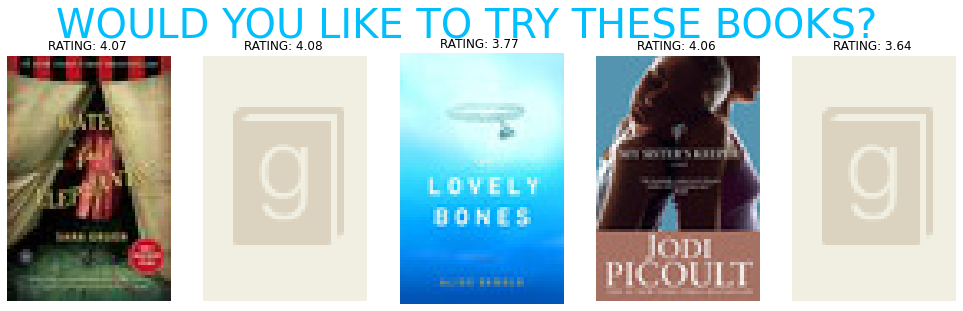

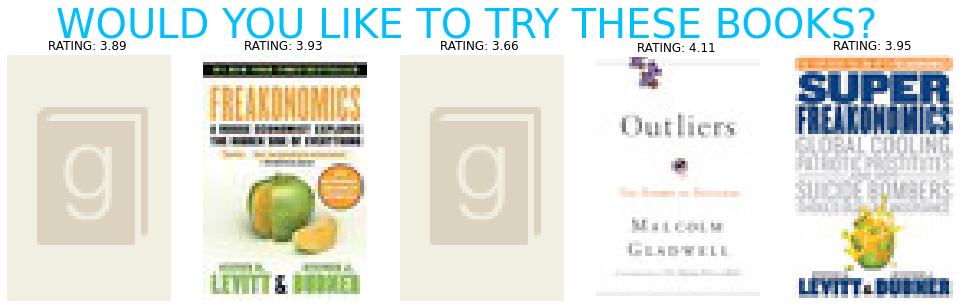

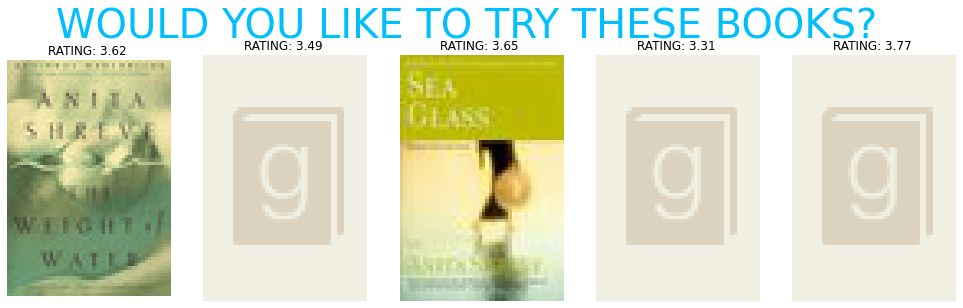

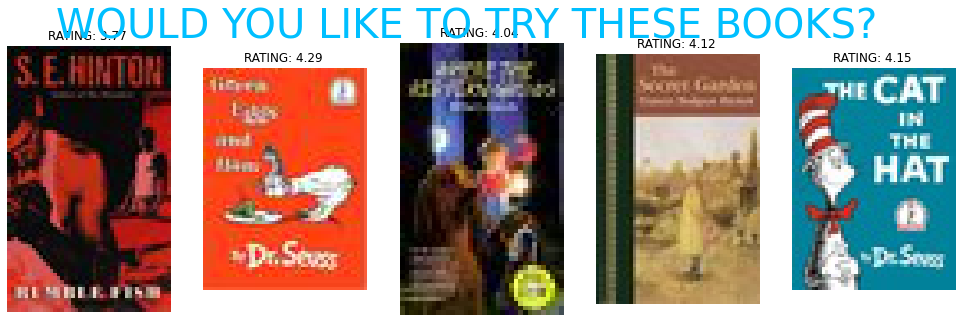

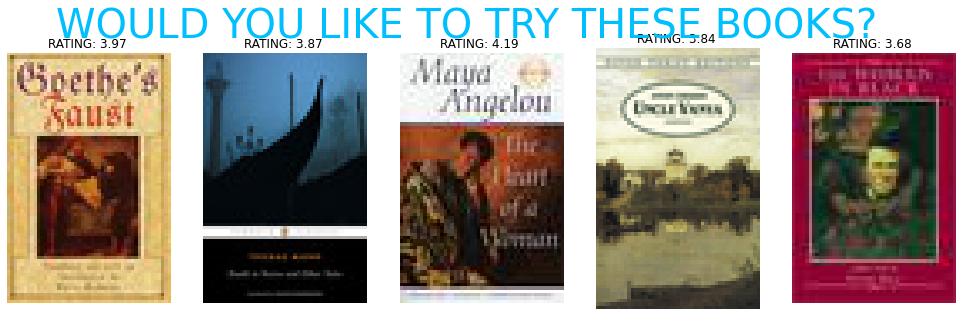

...

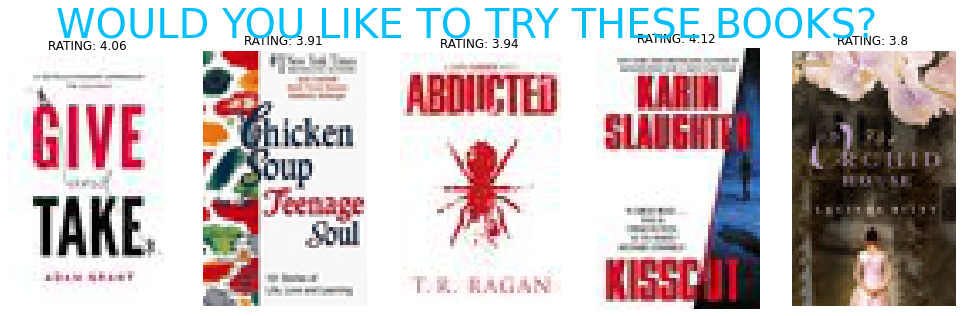

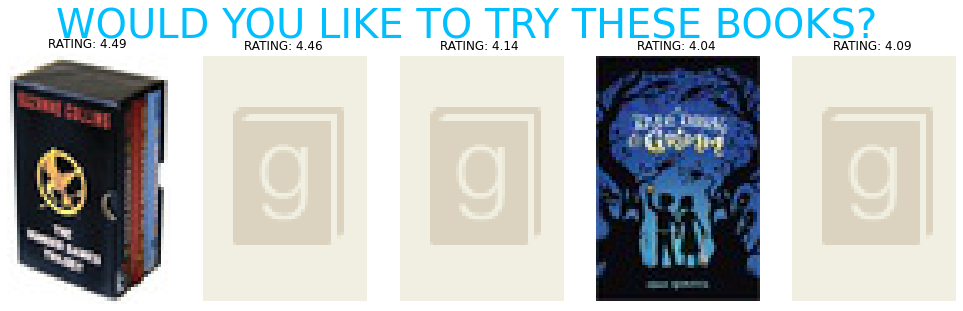

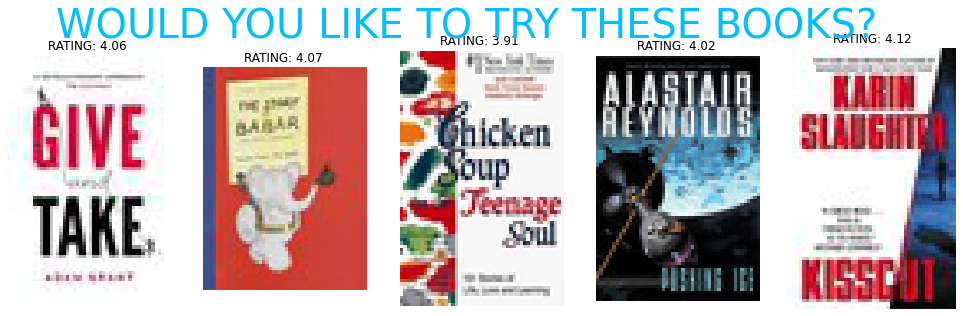

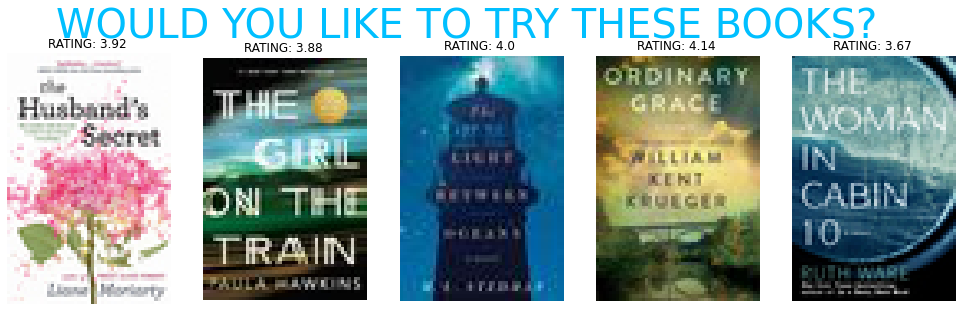

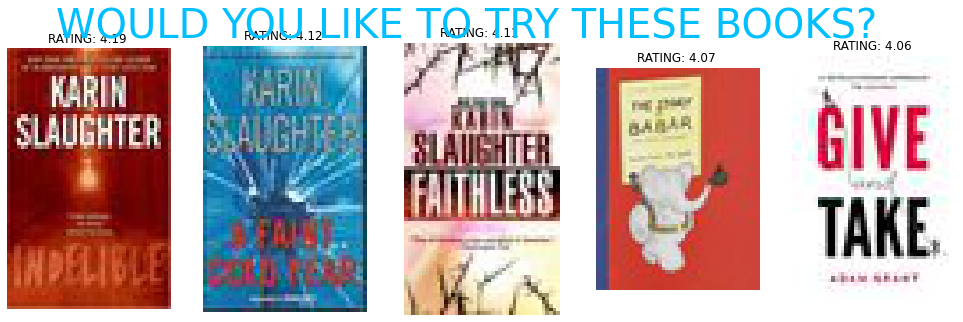

In [213]:
set_itemb=set()
for i in dfexample:
    set_itemb.update(set(item_based(i, books_data)['book_id'].tolist()))


In [214]:
print(set_itemb)

{1, 2566, 8710, 6151, 10, 2571, 4111, 15, 4112, 2066, 531, 17, 4117, 22, 5142, 20, 5650, 8218, 29, 2078, 2079, 31, 33, 8226, 544, 2597, 38, 39, 42, 2603, 43, 1069, 46, 5166, 9266, 567, 57, 58, 570, 61, 63, 64, 66, 1096, 9803, 76, 79, 9295, 7249, 7762, 8273, 83, 2648, 7259, 92, 93, 7776, 5220, 7269, 2150, 7268, 6760, 8809, 103, 8811, 9832, 109, 110, 111, 7791, 1648, 626, 625, 7792, 6774, 125, 5761, 642, 5762, 3715, 9861, 5253, 1159, 7303, 7817, 135, 1675, 5771, 7309, 142, 2193, 5117, 6806, 154, 9372, 157, 2207, 7840, 3743, 5282, 5795, 3234, 1696, 9893, 165, 9378, 681, 171, 2731, 2227, 8884, 4794, 1211, 188, 3773, 5312, 193, 192, 195, 8900, 4295, 9928, 6345, 714, 9931, 7371, 3274, 8905, 3279, 2251, 4808, 211, 2260, 8916, 9944, 5853, 8414, 5344, 2272, 1765, 2279, 3303, 6889, 235, 5359, 9456, 4849, 3315, 9973, 248, 5369, 6393, 251, 6395, 8445, 7418, 9465, 256, 1280, 258, 8451, 3328, 8904, 778, 4877, 2321, 2324, 1814, 9497, 8475, 4380, 9499, 798, 291, 4905, 7468, 1325, 3376, 7988, 8504, 313

### Result from USER-BASED COLLABORATIVE FILTERING

In [215]:
user_based_rec=user_based(books_data,specific_user_id)
books_for_user=common(books_data,user_based_rec,specific_user_id)
books_for_userDF=pd.DataFrame(books_for_user,columns=["book_id"])
set_userb=set(books_for_userDF['book_id'].tolist())
print(set_userb)

{2256, 25, 7254}


### Result from Recommendation based on book title

<font color=red>Notification:   
    If there is a warning or error, please just run the next line.
</font>

ValueError: empty vocabulary; perhaps the documents only contain stop words

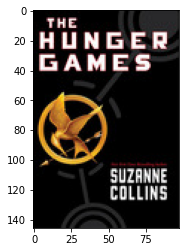

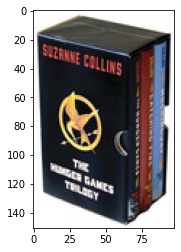

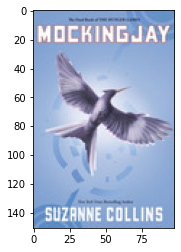

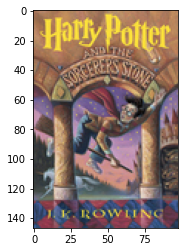

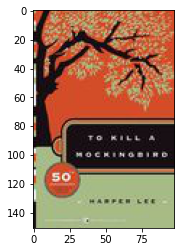

...

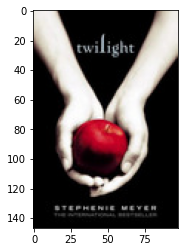

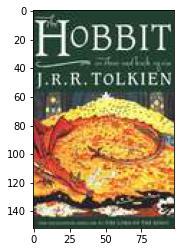

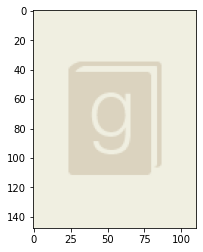

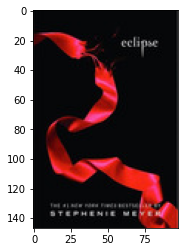

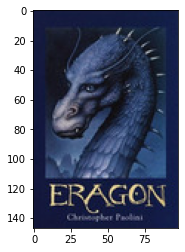

In [216]:
set_btitle=set()
for i in dfexample:
    a=books[books['book_id']==i][['title','language_code']]
    b=recommend(a['title'].tolist()[0],a['language_code'].tolist()[0]).tolist()
    set_btitle.update(set(b))


In [218]:
print(set_btitle)

{1, 2, 3, 4, 7, 402, 20, 349, 169, 42, 170, 243, 52, 53, 507}


### Result from Apriori

In [219]:
set_Apri=set()
if Rec_old(dfexample):
    set_Apri.update(set(Rec_old(dfexample)['book_id'].tolist()))
    print(set_Apri)
else:
    print('No result from Apriori')

* The book that Best fits your interested authors and languages: 

                                                title             authors  \
38  A Song of Ice and Fire (A Song of Ice and Fire...  George R.R. Martin   
37  A Song of Ice and Fire (A Song of Ice and Fire...  George R.R. Martin   
35  A Storm of Swords: Blood and Gold (A Song of I...  George R.R. Martin   
36  A Storm of Swords: Steel and Snow (A Song of I...  George R.R. Martin   
40  A Dance with Dragons: After the Feast (A Song ...  George R.R. Martin   
53                    How the Grinch Stole Christmas!           Dr. Seuss   
54                                          The Lorax           Dr. Seuss   
82         Frog and Toad All Year (Frog and Toad, #3)        Arnold Lobel   
39  A Dance with Dragons: Dreams and Dust (A Song ...  George R.R. Martin   
56                    The Sneetches and Other Stories           Dr. Seuss   

   language_code  average_rating  ratings_count  
38           eng            4.63   

## Concatenation of all recommended results

In [220]:
Recom_set=set()
Recom_set.update(set_itemb)
Recom_set.update(set_userb)
Recom_set.update(set_btitle)
Recom_set.update(set_Apri)
rec_books=books[books['book_id'].isin(list(Recom_set))].sort_values(by='average_rating',ascending=False)

rec_books=rec_books[~rec_books['book_id'].isin(dfexample)].head(10)
rec_books[['title','authors','language_code','average_rating','ratings_count']]

,title,authors,language_code,average_rating,ratings_count
7253,Homicidal Psycho Jungle Cat: A Calvin and Hobb...,Bill Watterson,eng,4.71,14113
5343,"A Game of Thrones: Comic Book, Issue 1","Daniel Abraham, George R.R. Martin, Tommy Patt...",eng,4.65,18667
24,Harry Potter and the Deathly Hallows (Harry Po...,"J.K. Rowling, Mary GrandPré",eng,4.61,1746574
191,The Name of the Wind (The Kingkiller Chronicle...,Patrick Rothfuss,eng,4.55,400101
2255,Jesus Calling: Enjoying Peace in His Presence,Sarah Young,NaN,4.54,35219
4848,"Father Mine (Black Dagger Brotherhood, #6.5)",J.R. Ward,eng,4.51,32178
506,The Hunger Games Trilogy Boxset (The Hunger Ga...,Suzanne Collins,eng,4.49,129665
2271,"The Millennium Trilogy (Millennium Trilogy, #1-3)","Stieg Larsson, Reg Keeland",eng,4.46,29944
30,The Help,Kathryn Stockett,eng,4.45,1531753
8450,Praying God's Word: Breaking Free From Spiritu...,Beth Moore,NaN,4.45,9530


YOU MAY ALSO LIKE THESE BOOKS


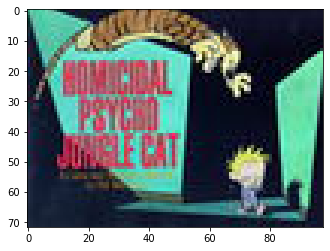

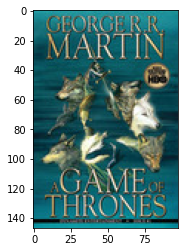

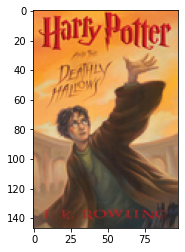

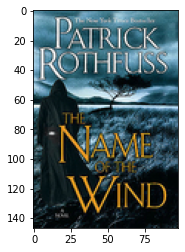

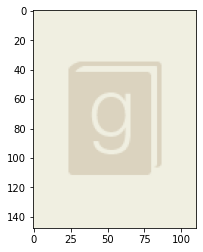

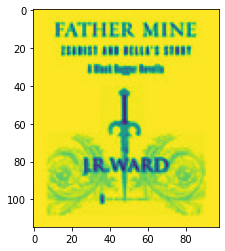

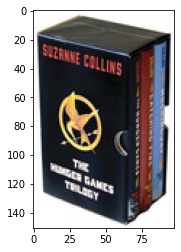

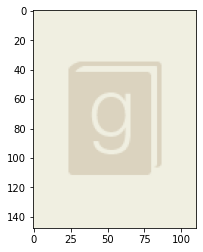

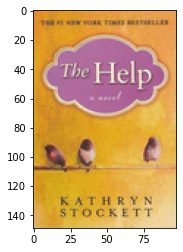

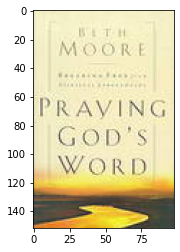

In [221]:
# Final Output: book recmmendation

print('YOU MAY ALSO LIKE THESE BOOKS')
for i in rec_books['image_url']:
        response = requests.get(i)
        img = Image.open(BytesIO(response.content))
        plt.figure()
        plt.imshow(img)

## Conclusion
We successfully combined these above individual filters into one big filter. The whole system combines the results of all filters, and finally outputs the top ten books ranked by 'average_rating' as the final recommended results. This system can recommend new books based on the old user's reading history.  
But is also have some limitations, we tried to finish the filter based on book title, but sometimes there are some unexpected error that we do not have time to fix that, but we want to keep it as our one try.